## ライブラリのインポート

In [ ]:
import time
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import japanize_matplotlib
import datetime
from IPython.display import display

from sklearn.model_selection import train_test_split
from sklearn.model_selection import TimeSeriesSplit

from sklearn.metrics import mean_squared_error

import torch
import pytorch_lightning as pl

import warnings
warnings.simplefilter('ignore')

## GitClone した MerlionフォルダからM4データセット用のライブラリを読込み

In [ ]:
import sys
sys.path.append("/content/Merlion/ts_datasets") # 適宜変更

from ts_datasets.forecast import M4

## データセットの作成（ただし重いのでボリュームを制限した）

In [ ]:
data = pd.DataFrame()

for i in range(len(M4(subset="Hourly"))):
    time_series, metadata = M4(subset="Hourly")[i]
    time_series.columns = ["value"]
    time_series["series"] = i
    time_series["time_idx"] = range(len(time_series))
    data = pd.concat([data, time_series], axis=0)

    if i > 20:
        break

data["static"] = 2
data = data.reset_index()
data.columns = ['ds', 'value', 'series', 'time_idx', 'static']
display(data)

100%|██████████| 414/414 [00:01<00:00, 412.73it/s]


,ds,value,series,time_idx,static
0,1970-01-01 00:00:00,605.0,0,0,2
1,1970-01-01 01:00:00,586.0,0,1,2
2,1970-01-01 02:00:00,586.0,0,2,2
3,1970-01-01 03:00:00,559.0,0,3,2
4,1970-01-01 04:00:00,511.0,0,4,2
...,...,...,...,...,...
16451,1970-01-31 23:00:00,764.0,21,743,2
16452,1970-02-01 00:00:00,764.0,21,744,2
16453,1970-02-01 01:00:00,763.0,21,745,2
16454,1970-02-01 02:00:00,740.0,21,746,2


## 各Seriesごとのデータのサイズと、期間が同じかどうか確認

In [ ]:
for i in range(len(data["series"].unique())):

    each_series_data = data[data["series"]==data["series"].unique()[i]]
    print("行数:", len(each_series_data), " 開始日付:", each_series_data["ds"].iloc[0], " 最終日付:", each_series_data["ds"].iloc[-1])

行数: 748  開始日付: 1970-01-01 00:00:00  最終日付: 1970-02-01 03:00:00
行数: 748  開始日付: 1970-01-01 00:00:00  最終日付: 1970-02-01 03:00:00
行数: 748  開始日付: 1970-01-01 00:00:00  最終日付: 1970-02-01 03:00:00
行数: 748  開始日付: 1970-01-01 00:00:00  最終日付: 1970-02-01 03:00:00
行数: 748  開始日付: 1970-01-01 00:00:00  最終日付: 1970-02-01 03:00:00
行数: 748  開始日付: 1970-01-01 00:00:00  最終日付: 1970-02-01 03:00:00
行数: 748  開始日付: 1970-01-01 00:00:00  最終日付: 1970-02-01 03:00:00
行数: 748  開始日付: 1970-01-01 00:00:00  最終日付: 1970-02-01 03:00:00
行数: 748  開始日付: 1970-01-01 00:00:00  最終日付: 1970-02-01 03:00:00
行数: 748  開始日付: 1970-01-01 00:00:00  最終日付: 1970-02-01 03:00:00
行数: 748  開始日付: 1970-01-01 00:00:00  最終日付: 1970-02-01 03:00:00
行数: 748  開始日付: 1970-01-01 00:00:00  最終日付: 1970-02-01 03:00:00
行数: 748  開始日付: 1970-01-01 00:00:00  最終日付: 1970-02-01 03:00:00
行数: 748  開始日付: 1970-01-01 00:00:00  最終日付: 1970-02-01 03:00:00
行数: 748  開始日付: 1970-01-01 00:00:00  最終日付: 1970-02-01 03:00:00
行数: 748  開始日付: 1970-01-01 00:00:00  最終日付: 1970-02-01 03:00:00
行数: 748 

## データセットをSeries ごとにグラフ表示

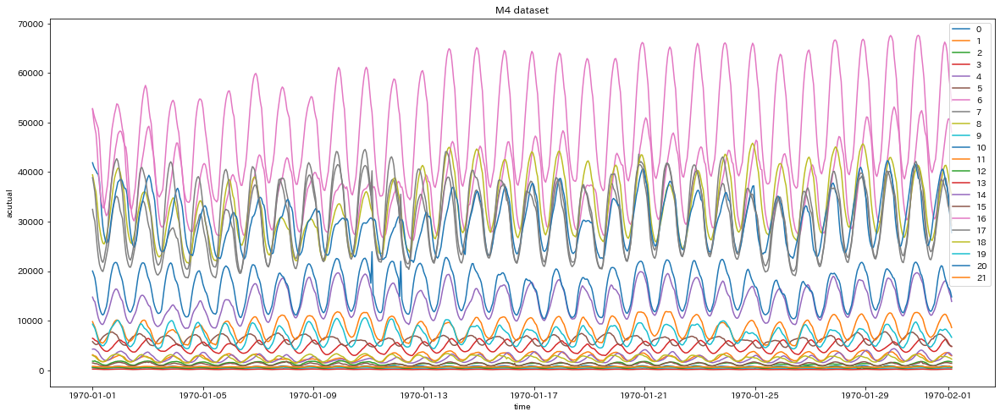

In [ ]:
# グラフ表示
fig = plt.figure(figsize=(20, 8))

plt.title("M4 dataset")
plt.xlabel("time")
plt.ylabel("acutual")

for i in range(len(data["series"].unique())):
    each_series_data = data[data["series"]==i]
    plt.plot(each_series_data["ds"], each_series_data["value"], label=str(i))

plt.legend()
plt.show()

## シード値の固定

In [ ]:
SEED = 42

random.seed(SEED)
np.random.seed(SEED)
os.environ["PYTHONHASHSEED"] = str(SEED)

torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.benchmark = False
torch.backends.cudnn.deterministic = True

pl.seed_everything(SEED)

Global seed set to 42


42

## Pytorch_Forcast with N-Beats

In [ ]:
from pytorch_lightning.callbacks import EarlyStopping

from pytorch_forecasting import Baseline, NBeats, TimeSeriesDataSet
from pytorch_forecasting.data import NaNLabelEncoder
from pytorch_forecasting.data.examples import generate_ar_data
from pytorch_forecasting.metrics import SMAPE

In [ ]:
# パラメーター
batch_size = 128
limit_train_batche_size=30
EPOCH = 5
LR  = 1e-4

In [ ]:
# 使用するGPUの数
if torch.cuda.is_available():
    gpu_nums = torch.cuda.device_count()
else:
    gpu_nums = 0

## 学習データ、テストデータの分割

test size: 0.29411764705882354


,ds,value,series,time_idx,static
528,1970-01-23 00:00:00,809.0,0,528,2
529,1970-01-23 01:00:00,766.0,0,529,2
530,1970-01-23 02:00:00,755.0,0,530,2
531,1970-01-23 03:00:00,703.0,0,531,2
532,1970-01-23 04:00:00,635.0,0,532,2


,ds,value,series,time_idx,static
16451,1970-01-31 23:00:00,764.0,21,743,2
16452,1970-02-01 00:00:00,764.0,21,744,2
16453,1970-02-01 01:00:00,763.0,21,745,2
16454,1970-02-01 02:00:00,740.0,21,746,2
16455,1970-02-01 03:00:00,725.0,21,747,2


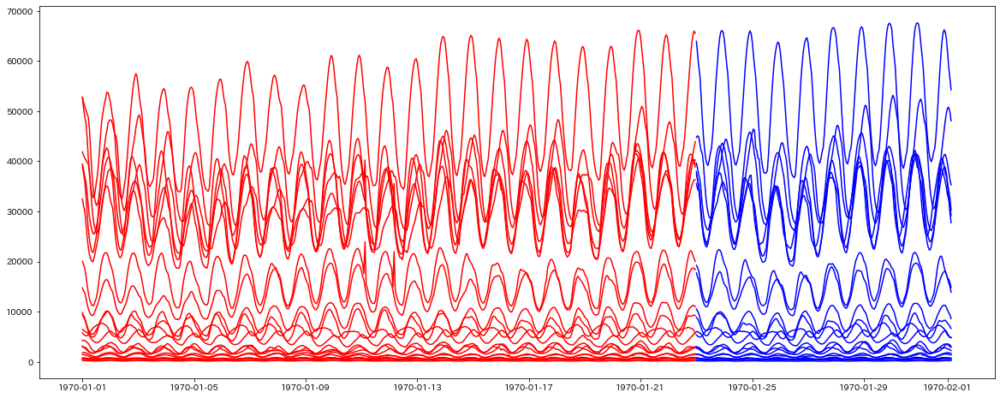

In [ ]:
threashold = datetime.datetime(1970, 1, 23, 0, 0, 0)

print("test size:", len(data[data["ds"]>=threashold]) / len(data["ds"]))

display(data[data["ds"]>=threashold].head())
display(data[data["ds"]>=threashold].tail())

train = data[data["ds"]<threashold]
test = data[data["ds"]>=threashold]

# テスト
assert len(data) == (len(train) + len(test))

# グラフ表示
fig = plt.figure(figsize=(20, 8))

series_list = train["series"].unique()
for i in range(len(series_list)):
    plt.plot(
        train[train["series"]==series_list[i]]["ds"], 
        train[train["series"]==series_list[i]]["value"], 
        color="blue"
        )

    plt.plot(
        test[test["series"]==series_list[i]]["ds"], 
        test[test["series"]==series_list[i]]["value"], 
        color="orange"
        )

## 学習

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs


                       ds    value  series  time_idx  static
0     1970-01-01 00:00:00    605.0       0         0       2
748   1970-01-01 00:00:00   3124.0       1         0       2
1496  1970-01-01 00:00:00   1828.0       2         0       2
2244  1970-01-01 00:00:00   6454.0       3         0       2
2992  1970-01-01 00:00:00   4263.0       4         0       2
...                   ...      ...     ...       ...     ...
12793 1970-01-04 05:00:00  25788.0      17        77       2
13541 1970-01-04 05:00:00   1910.0      18        77       2
14289 1970-01-04 05:00:00   5611.0      19        77       2
15037 1970-01-04 05:00:00  13469.0      20        77       2
15785 1970-01-04 05:00:00    703.0      21        77       2

[1716 rows x 5 columns]


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type       | Params
-----------------------------------------------
0 | loss            | MASE       | 0     
1 | logging_metrics | ModuleList | 0     
2 | net_blocks      | ModuleList | 1.6 M 
-----------------------------------------------
1.6 M     Trainable params
0         Non-trainable params
1.6 M     Total params
6.539     Total estimated model params size (MB)


baseline absolute error :0.04478739947080612


Global seed set to 42


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{'val_MAE': 1842.62744140625,
 'val_MAPE': 0.1585511714220047,
 'val_MASE': 3.738654136657715,
 'val_RMSE': 2594.19775390625,
 'val_SMAPE': 0.15623319149017334,
 'val_backcast_loss': 0.11535227298736572,
 'val_forecast_loss': 3.738654136657715,
 'val_loss': 3.738654136657715}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{'val_MAE': 1842.32763671875,
 'val_MAPE': 0.15852323174476624,
 'val_MASE': 3.7380363941192627,
 'val_RMSE': 2593.7841796875,
 'val_SMAPE': 0.15620772540569305,
 'val_backcast_loss': 0.11534971743822098,
 'val_forecast_loss': 3.7380363941192627,
 'val_loss': 3.7380363941192627}
--------------------------------------------------------------------------------
-----------------------------------------------------------

LR finder stopped early after 40 steps due to diverging loss.
Restoring states from the checkpoint file at /content/lr_find_temp_model.ckpt
Restored all states from the checkpoint file at /content/lr_find_temp_model.ckpt


--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{'val_MAE': 1828.1387939453125,
 'val_MAPE': 0.15720731019973755,
 'val_MASE': 3.7089056968688965,
 'val_RMSE': 2574.204833984375,
 'val_SMAPE': 0.15500499308109283,
 'val_backcast_loss': 0.1152324452996254,
 'val_forecast_loss': 3.7089056968688965,
 'val_loss': 3.7089056968688965}
--------------------------------------------------------------------------------
suggested learning rate: 3.981071705534973e-05


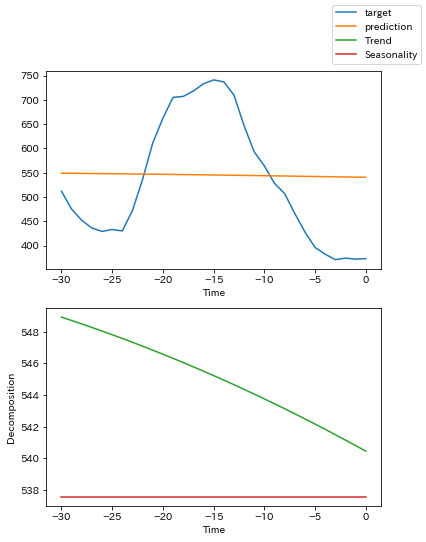

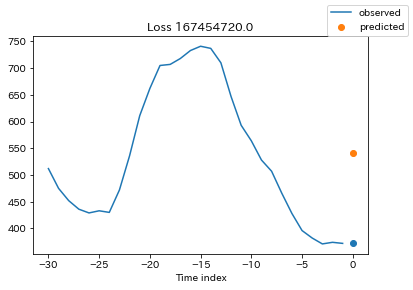

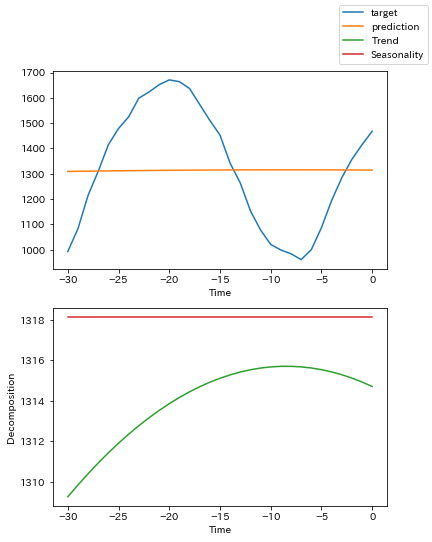

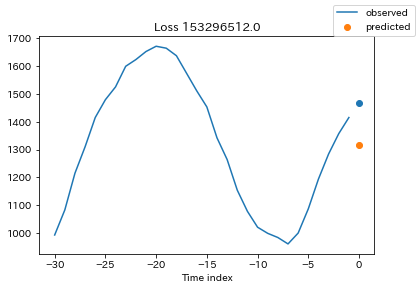

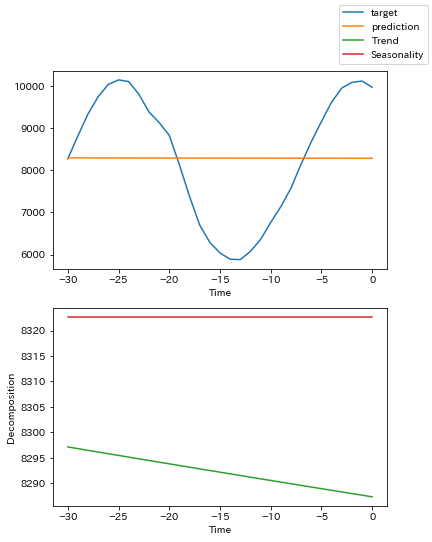

...

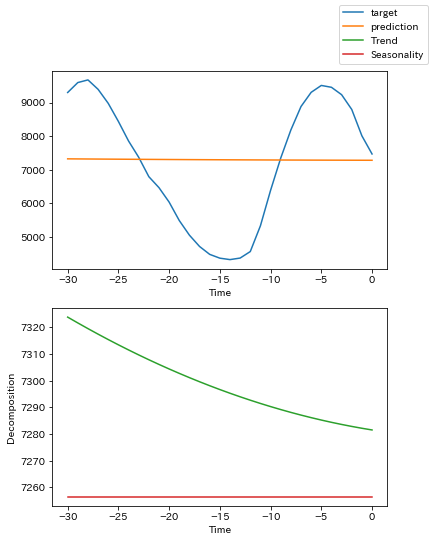

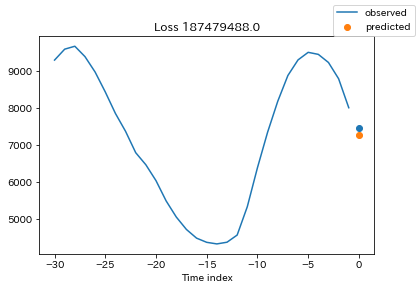

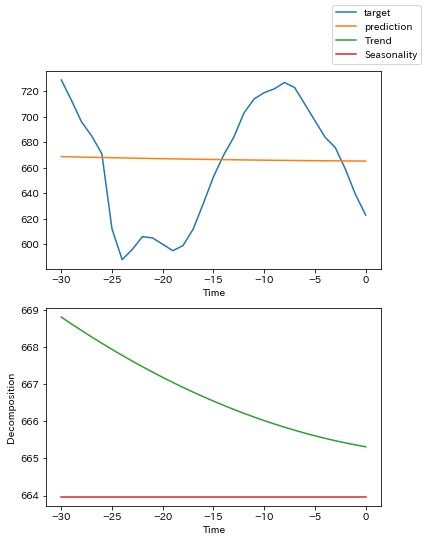

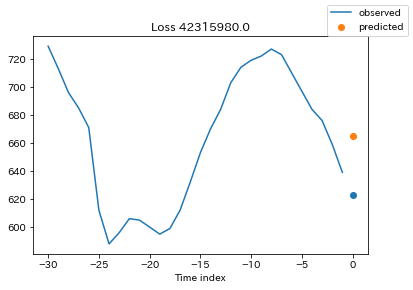

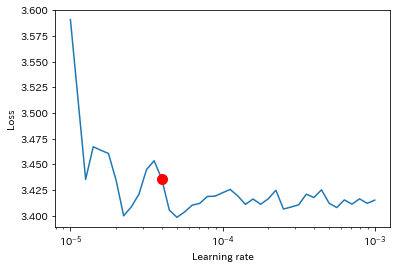

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type       | Params
-----------------------------------------------
0 | loss            | MASE       | 0     
1 | logging_metrics | ModuleList | 0     
2 | net_blocks      | ModuleList | 1.6 M 
-----------------------------------------------
1.6 M     Trainable params
0         Non-trainable params
1.6 M     Total params
6.539     Total estimated model params size (MB)


Validation sanity check: 0it [00:00, ?it/s]

Global seed set to 42


Training: 7it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
GPU available: True, used: True


0 RMSE 3106.061279296875
                       ds    value  series  time_idx  static
0     1970-01-01 00:00:00    605.0       0         0       2
748   1970-01-01 00:00:00   3124.0       1         0       2
1496  1970-01-01 00:00:00   1828.0       2         0       2
2244  1970-01-01 00:00:00   6454.0       3         0       2
2992  1970-01-01 00:00:00   4263.0       4         0       2
...                   ...      ...     ...       ...     ...
12883 1970-01-07 23:00:00  35015.0      17       167       2
13631 1970-01-07 23:00:00   2476.0      18       167       2
14379 1970-01-07 23:00:00   7768.0      19       167       2
15127 1970-01-07 23:00:00  18371.0      20       167       2
15875 1970-01-07 23:00:00    763.0      21       167       2

[3696 rows x 5 columns]


TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type       | Params
-----------------------------------------------
0 | loss            | MASE       | 0     
1 | logging_metrics | ModuleList | 0     
2 | net_blocks      | ModuleList | 1.6 M 
-----------------------------------------------
1.6 M     Trainable params
0         Non-trainable params
1.6 M     Total params
6.539     Total estimated model params size (MB)


baseline absolute error :0.04509510472416878


Global seed set to 42


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{'val_MAE': 1847.6649169921875,
 'val_MAPE': 0.16041484475135803,
 'val_MASE': 3.5713653564453125,
 'val_RMSE': 2593.44287109375,
 'val_SMAPE': 0.15180857479572296,
 'val_backcast_loss': 0.11540336906909943,
 'val_forecast_loss': 3.5713653564453125,
 'val_loss': 3.5713653564453125}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{'val_MAE': 1812.7392578125,
 'val_MAPE': 0.15742969512939453,
 'val_MASE': 3.503244400024414,
 'val_RMSE': 2545.929443359375,
 'val_SMAPE': 0.1490267515182495,
 'val_backcast_loss': 0.11528923362493515,
 'val_forecast_loss': 3.503244400024414,
 'val_loss': 3.503244400024414}
--------------------------------------------------------------------------------
--------------------------------------------------------

Restoring states from the checkpoint file at /content/lr_find_temp_model.ckpt
Restored all states from the checkpoint file at /content/lr_find_temp_model.ckpt


suggested learning rate: 0.03548133892335753


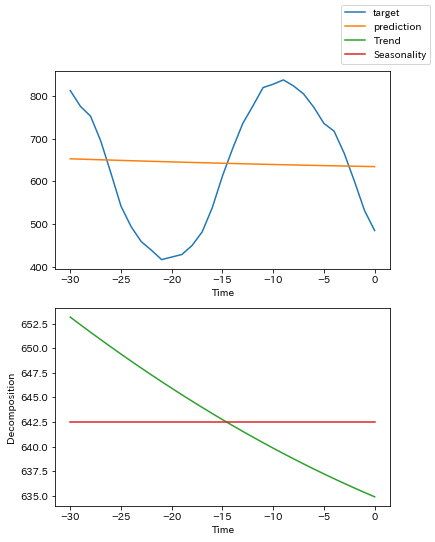

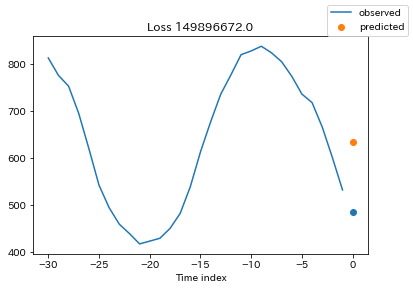

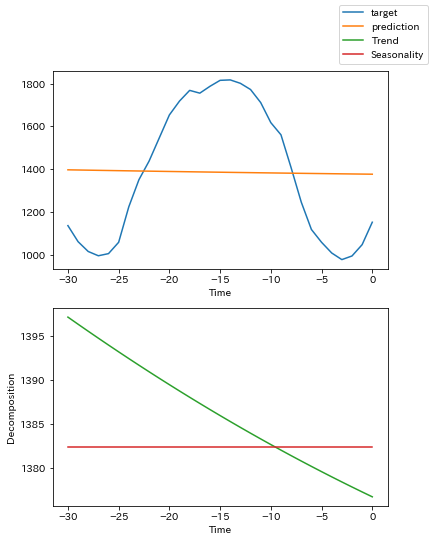

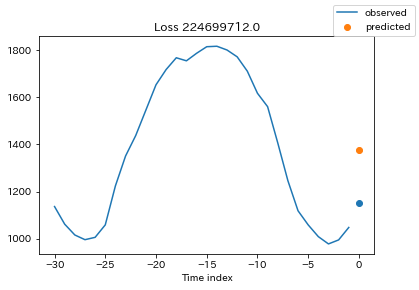

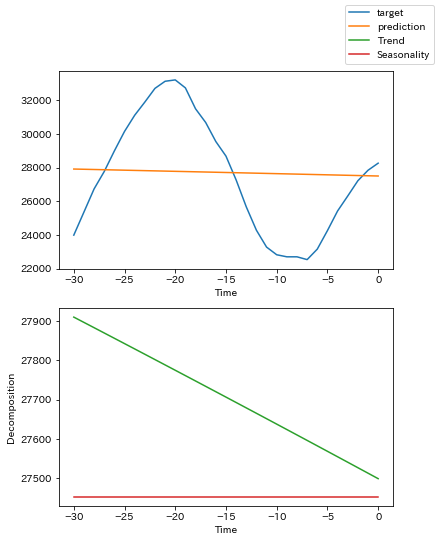

...

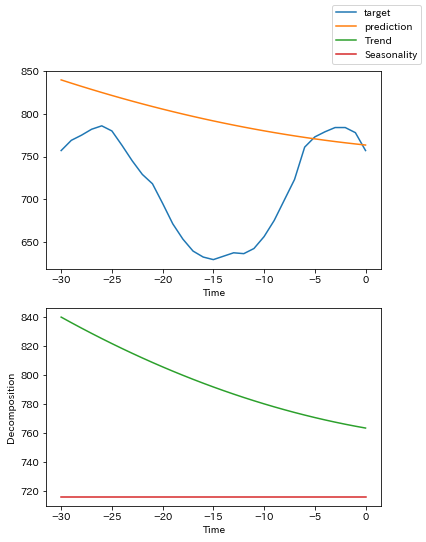

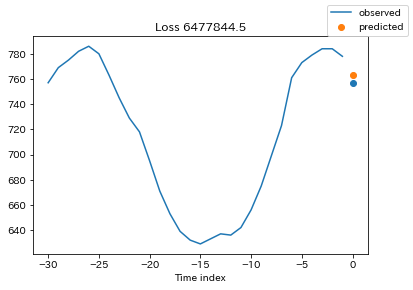

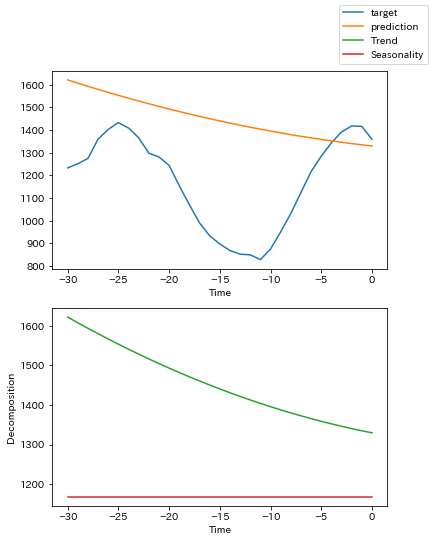

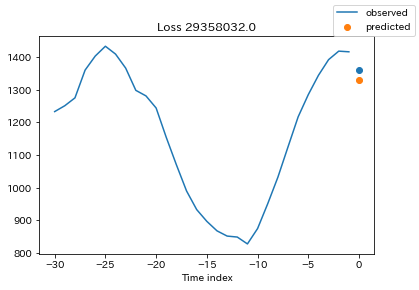

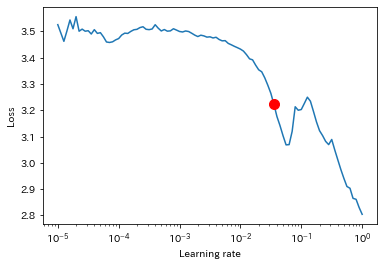

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type       | Params
-----------------------------------------------
0 | loss            | MASE       | 0     
1 | logging_metrics | ModuleList | 0     
2 | net_blocks      | ModuleList | 1.6 M 
-----------------------------------------------
1.6 M     Trainable params
0         Non-trainable params
1.6 M     Total params
6.539     Total estimated model params size (MB)


Validation sanity check: 0it [00:00, ?it/s]

Global seed set to 42


Training: 7it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs


1 RMSE 476.15435791015625
                       ds    value  series  time_idx  static
0     1970-01-01 00:00:00    605.0       0         0       2
748   1970-01-01 00:00:00   3124.0       1         0       2
1496  1970-01-01 00:00:00   1828.0       2         0       2
2244  1970-01-01 00:00:00   6454.0       3         0       2
2992  1970-01-01 00:00:00   4263.0       4         0       2
...                   ...      ...     ...       ...     ...
12973 1970-01-11 17:00:00  40204.0      17       257       2
13721 1970-01-11 17:00:00   2987.0      18       257       2
14469 1970-01-11 17:00:00   9528.0      19       257       2
15217 1970-01-11 17:00:00  20563.0      20       257       2
15965 1970-01-11 17:00:00    647.0      21       257       2

[5676 rows x 5 columns]


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type       | Params
-----------------------------------------------
0 | loss            | MASE       | 0     
1 | logging_metrics | ModuleList | 0     
2 | net_blocks      | ModuleList | 1.6 M 
-----------------------------------------------
1.6 M     Trainable params
0         Non-trainable params
1.6 M     Total params
6.539     Total estimated model params size (MB)


baseline absolute error :0.04372623190283775


Global seed set to 42


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{'val_MAE': 1933.1123046875,
 'val_MAPE': 0.15253691375255585,
 'val_MASE': 3.5548248291015625,
 'val_RMSE': 2790.552734375,
 'val_SMAPE': 0.14836186170578003,
 'val_backcast_loss': 0.11292671412229538,
 'val_forecast_loss': 3.5548248291015625,
 'val_loss': 3.5548248291015625}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{'val_MAE': 1764.234130859375,
 'val_MAPE': 0.13958817720413208,
 'val_MASE': 3.249540090560913,
 'val_RMSE': 2566.483154296875,
 'val_SMAPE': 0.135867640376091,
 'val_backcast_loss': 0.11259192228317261,
 'val_forecast_loss': 3.249540090560913,
 'val_loss': 3.249540090560913}
--------------------------------------------------------------------------------
------------------------------------------------------------

Restoring states from the checkpoint file at /content/lr_find_temp_model.ckpt
Restored all states from the checkpoint file at /content/lr_find_temp_model.ckpt


suggested learning rate: 0.05011872336272722


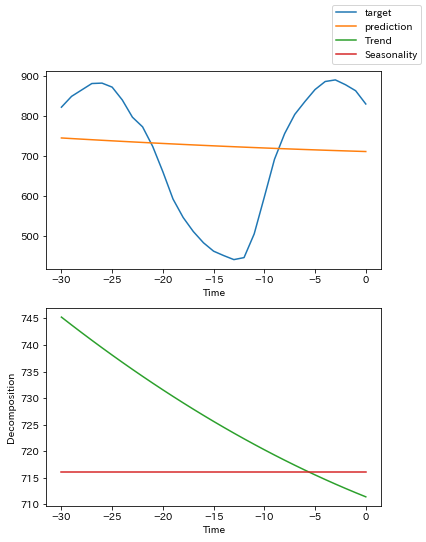

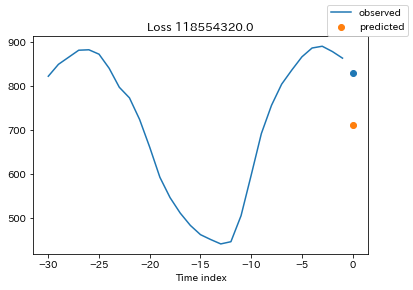

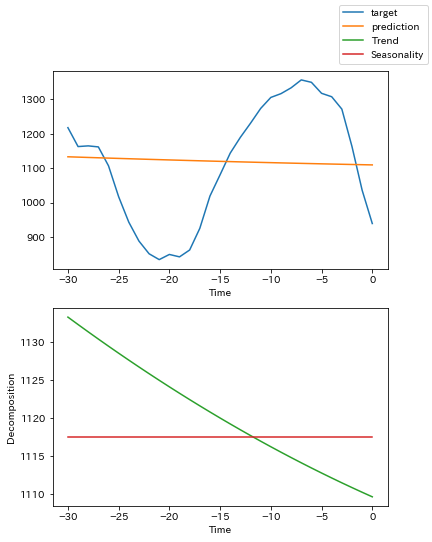

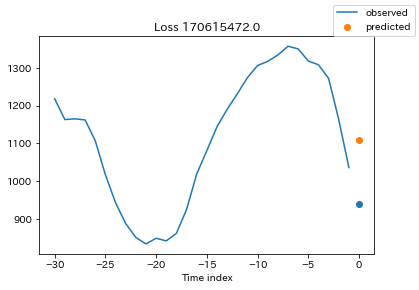

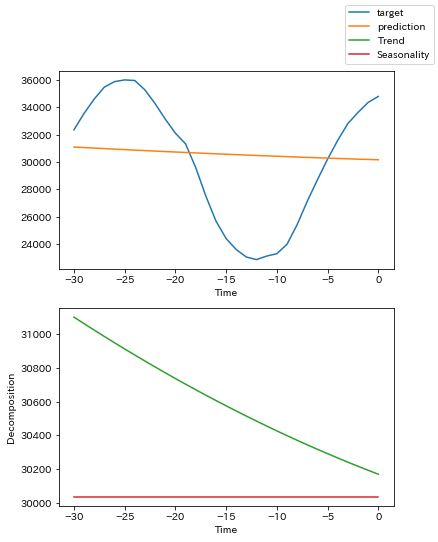

...

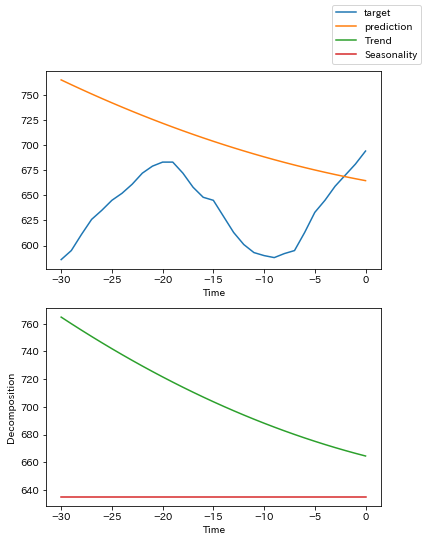

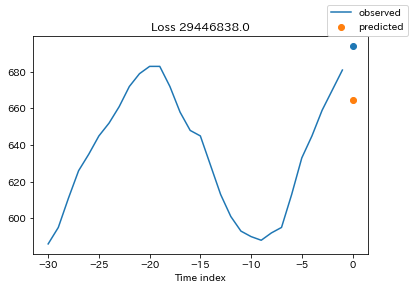

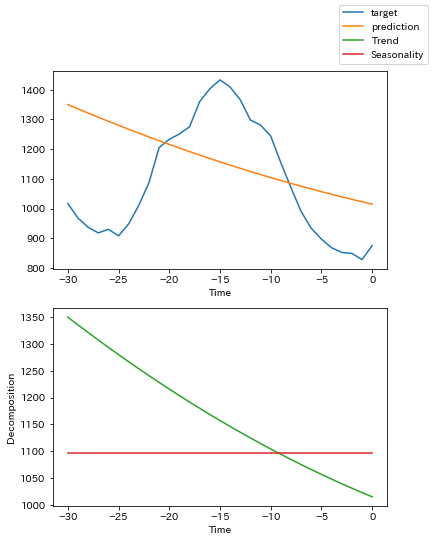

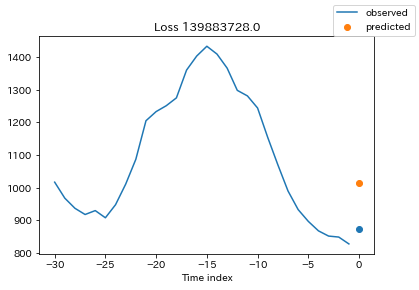

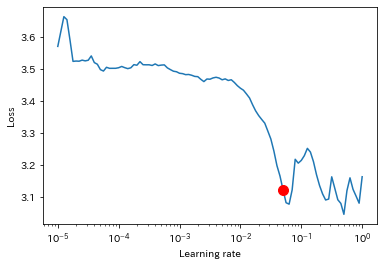

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type       | Params
-----------------------------------------------
0 | loss            | MASE       | 0     
1 | logging_metrics | ModuleList | 0     
2 | net_blocks      | ModuleList | 1.6 M 
-----------------------------------------------
1.6 M     Trainable params
0         Non-trainable params
1.6 M     Total params
6.539     Total estimated model params size (MB)


Validation sanity check: 0it [00:00, ?it/s]

Global seed set to 42


Training: 9it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs


2 RMSE 456.0794677734375
                       ds    value  series  time_idx  static
0     1970-01-01 00:00:00    605.0       0         0       2
748   1970-01-01 00:00:00   3124.0       1         0       2
1496  1970-01-01 00:00:00   1828.0       2         0       2
2244  1970-01-01 00:00:00   6454.0       3         0       2
2992  1970-01-01 00:00:00   4263.0       4         0       2
...                   ...      ...     ...       ...     ...
13063 1970-01-15 11:00:00  25533.0      17       347       2
13811 1970-01-15 11:00:00   2018.0      18       347       2
14559 1970-01-15 11:00:00   5781.0      19       347       2
15307 1970-01-15 11:00:00  12870.0      20       347       2
16055 1970-01-15 11:00:00    620.0      21       347       2

[7656 rows x 5 columns]


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f5df95fda70>
Traceback (most recent call last):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f5df95fda70>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1328, in __del__
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1328, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1320, in _shutdown_workers
    self._shutdown_workers()
    if w.is_alive():
  File "/usr/lib/python3.7/multiprocessing/process.py", line 151, in is_alive
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1320, in _shutdown_workers
    if w.is_alive():
    assert self._parent_pid == os.g

baseline absolute error :0.042084597051143646


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f5df95fda70>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1328, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1320, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.7/multiprocessing/process.py", line 151, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f5df95fda70>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1328, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1320, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/pytho

Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{'val_MAE': 1801.1500244140625,
 'val_MAPE': 0.14566347002983093,
 'val_MASE': 3.4108147621154785,
 'val_RMSE': 2577.0,
 'val_SMAPE': 0.1413591057062149,
 'val_backcast_loss': 0.11426088958978653,
 'val_forecast_loss': 3.4108147621154785,
 'val_loss': 3.4108147621154785}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{'val_MAE': 1636.212890625,
 'val_MAPE': 0.13252513110637665,
 'val_MASE': 3.089324712753296,
 'val_RMSE': 2341.24951171875,
 'val_SMAPE': 0.12835240364074707,
 'val_backcast_loss': 0.11385747790336609,
 'val_forecast_loss': 3.089324712753296,
 'val_loss': 3.089324712753296}
--------------------------------------------------------------------------------
--------------------------------------------------------------------

Restoring states from the checkpoint file at /content/lr_find_temp_model.ckpt
Restored all states from the checkpoint file at /content/lr_find_temp_model.ckpt


suggested learning rate: 0.03548133892335753


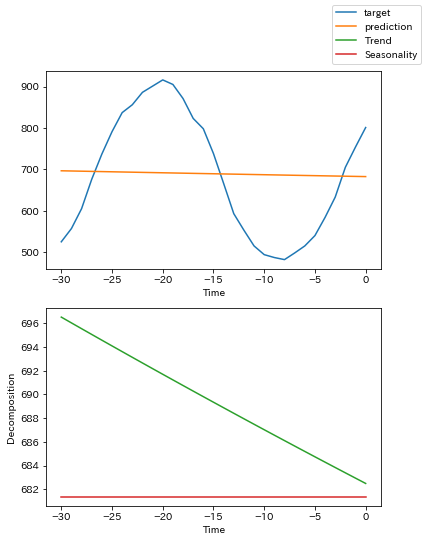

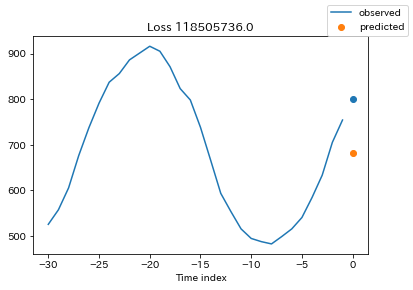

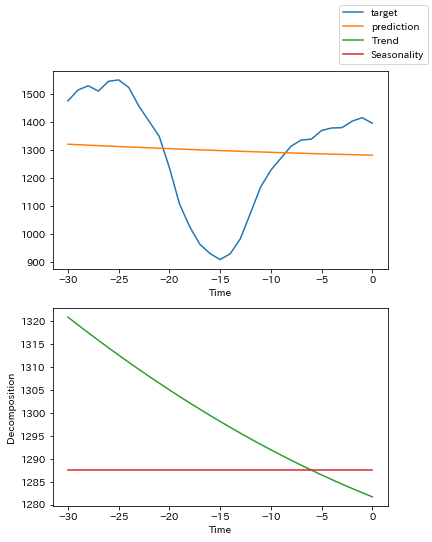

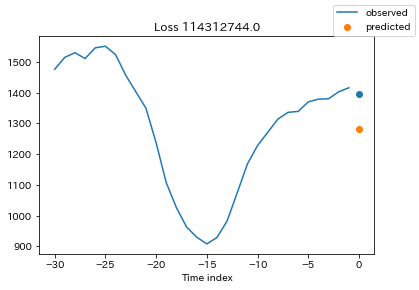

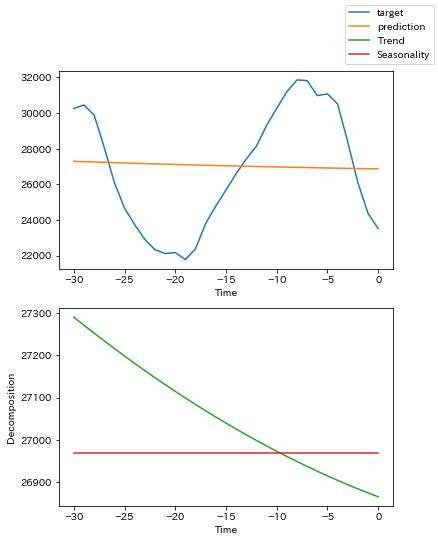

...

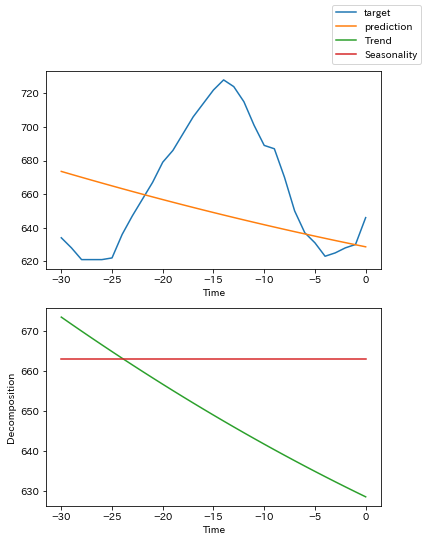

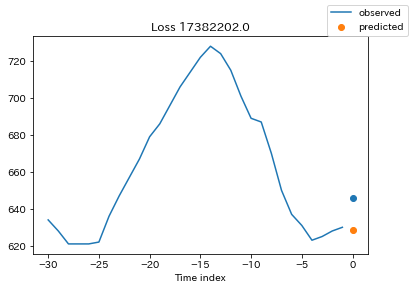

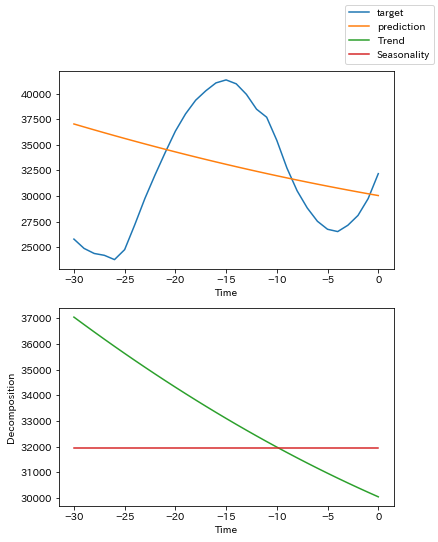

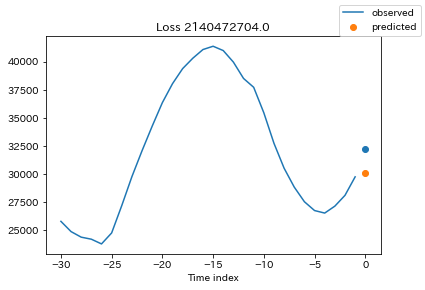

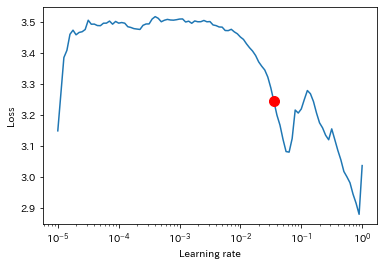

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type       | Params
-----------------------------------------------
0 | loss            | MASE       | 0     
1 | logging_metrics | ModuleList | 0     
2 | net_blocks      | ModuleList | 1.6 M 
-----------------------------------------------
1.6 M     Trainable params
0         Non-trainable params
1.6 M     Total params
6.539     Total estimated model params size (MB)


Validation sanity check: 0it [00:00, ?it/s]

Global seed set to 42


Training: 9it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs


3 RMSE 343.26007080078125
                       ds    value  series  time_idx  static
0     1970-01-01 00:00:00    605.0       0         0       2
748   1970-01-01 00:00:00   3124.0       1         0       2
1496  1970-01-01 00:00:00   1828.0       2         0       2
2244  1970-01-01 00:00:00   6454.0       3         0       2
2992  1970-01-01 00:00:00   4263.0       4         0       2
...                   ...      ...     ...       ...     ...
13153 1970-01-19 05:00:00  25110.0      17       437       2
13901 1970-01-19 05:00:00   1911.0      18       437       2
14649 1970-01-19 05:00:00   5432.0      19       437       2
15397 1970-01-19 05:00:00  13020.0      20       437       2
16145 1970-01-19 05:00:00    684.0      21       437       2

[9636 rows x 5 columns]


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type       | Params
-----------------------------------------------
0 | loss            | MASE       | 0     
1 | logging_metrics | ModuleList | 0     
2 | net_blocks      | ModuleList | 1.6 M 
-----------------------------------------------
1.6 M     Trainable params
0         Non-trainable params
1.6 M     Total params
6.539     Total estimated model params size (MB)


baseline absolute error :0.043872538954019547


Global seed set to 42


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{'val_MAE': 2018.4801025390625,
 'val_MAPE': 0.15109948813915253,
 'val_MASE': 3.4416403770446777,
 'val_RMSE': 2921.8818359375,
 'val_SMAPE': 0.1477731168270111,
 'val_backcast_loss': 0.11434446275234222,
 'val_forecast_loss': 3.4416403770446777,
 'val_loss': 3.4416403770446777}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{'val_MAE': 1829.1151123046875,
 'val_MAPE': 0.13766078650951385,
 'val_MASE': 3.1164207458496094,
 'val_RMSE': 2672.205322265625,
 'val_SMAPE': 0.13431790471076965,
 'val_backcast_loss': 0.1140102967619896,
 'val_forecast_loss': 3.1164207458496094,
 'val_loss': 3.1164207458496094}
--------------------------------------------------------------------------------
----------------------------------------------------

Restoring states from the checkpoint file at /content/lr_find_temp_model.ckpt
Restored all states from the checkpoint file at /content/lr_find_temp_model.ckpt


suggested learning rate: 0.03548133892335753


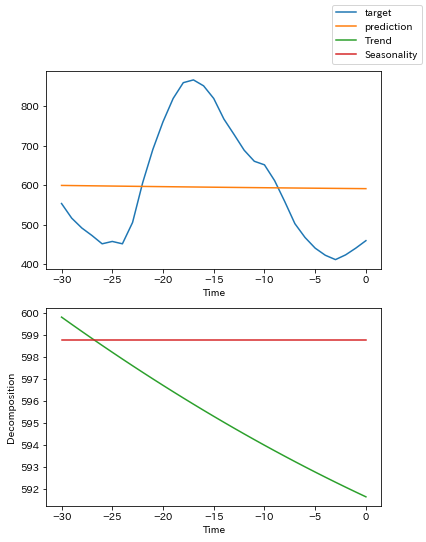

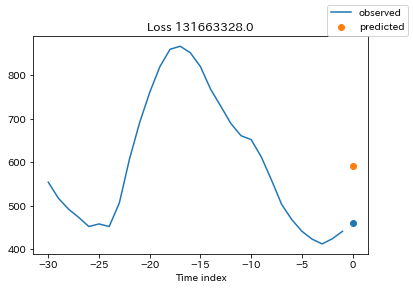

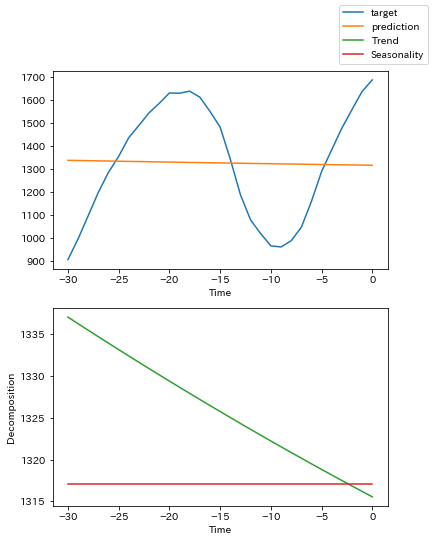

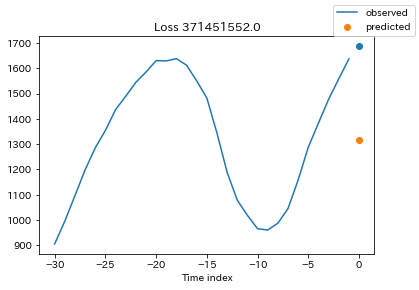

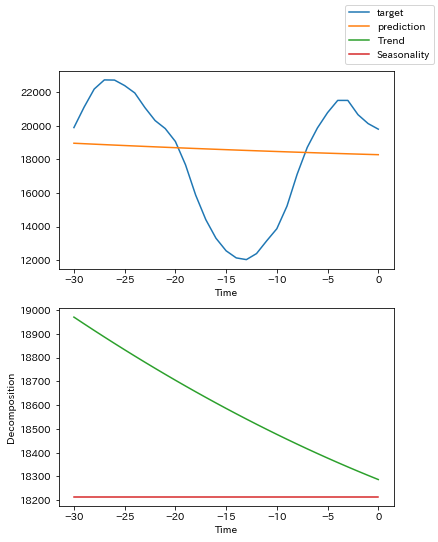

...

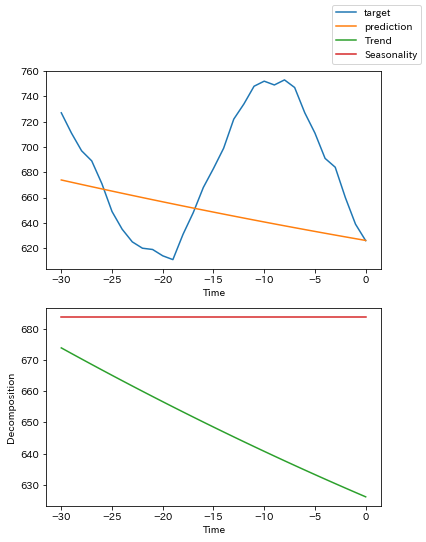

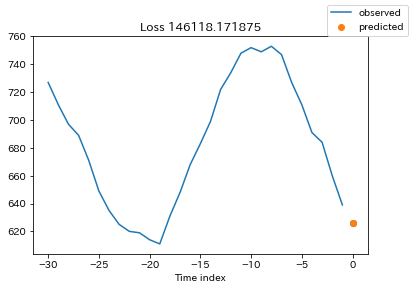

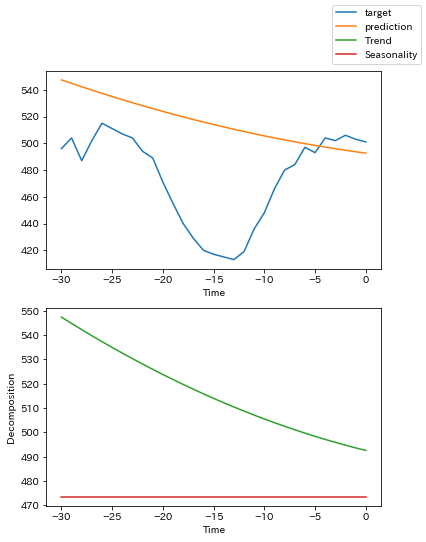

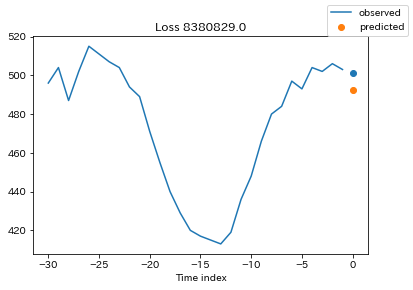

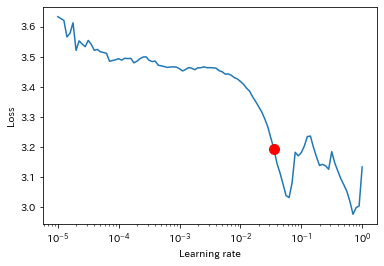

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type       | Params
-----------------------------------------------
0 | loss            | MASE       | 0     
1 | logging_metrics | ModuleList | 0     
2 | net_blocks      | ModuleList | 1.6 M 
-----------------------------------------------
1.6 M     Trainable params
0         Non-trainable params
1.6 M     Total params
6.539     Total estimated model params size (MB)


Validation sanity check: 0it [00:00, ?it/s]

Global seed set to 42


Training: 9it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

4 RMSE 339.89013671875
CROSS_RMSE 944.2890625


In [ ]:
### 交差検証
FOLD = 5
cross_rmse_nbeats = []

train_sort = train.sort_values(["ds", "series"])

tscv = TimeSeriesSplit(n_splits=FOLD, test_size=22*90)

for fold, (train_index, valid_index) in enumerate(tscv.split(train)):

    # 学習用データセットの作成
    training = TimeSeriesDataSet(
        train_sort.iloc[train_index],
        time_idx="time_idx",
        target="value",
        categorical_encoders={"series": NaNLabelEncoder().fit(data.series)},
        group_ids=["series"],
        # only unknown variable is "value" - and N-Beats can also not take any additional variables
        time_varying_unknown_reals=["value"],
    )

    # 検証用データセットの作成
    validation = TimeSeriesDataSet(
        train_sort.iloc[valid_index],
        time_idx="time_idx",
        target="value",
        categorical_encoders={"series": NaNLabelEncoder().fit(data.series)},
        group_ids=["series"],
        time_varying_unknown_reals=["value"],
    )

    # データローダーの作成
    train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=2)
    val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size, num_workers=2)

    # モデル作成
    trainer = pl.Trainer(
        gpus=gpu_nums, 
        gradient_clip_val=0.01,
        deterministic=True
        )

    net = NBeats.from_dataset(
        training, 
        learning_rate=LR, 
        weight_decay=1e-2, 
        widths=[32, 512], 
        backcast_loss_ratio=0.1
    )


    early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=10, verbose=False, mode="min")

    # ベースラインの学習
    trainer = pl.Trainer(
        max_epochs=EPOCH,
        gpus=gpu_nums,
        weights_summary="top",
        gradient_clip_val=0.01,
        callbacks=[early_stop_callback],
        limit_train_batches=limit_train_batche_size=10,
        deterministic=True
    )

    net = NBeats.from_dataset(
        training,
        learning_rate=LR,
        log_interval=10,
        log_val_interval=1,
        weight_decay=1e-2,
        widths=[32, 512],
        backcast_loss_ratio=1.0,
    )

    # ベースラインの精度評価
    actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
    baseline_predictions = Baseline().predict(val_dataloader)
    print(f"baseline absolute error :{SMAPE()(baseline_predictions, actuals)}")

    # 最適な学習率の探索
    res = trainer.tuner.lr_find(net, train_dataloader=train_dataloader, val_dataloaders=val_dataloader, min_lr=1e-5)
    print(f"suggested learning rate: {res.suggestion()}")
    fig = res.plot(show=True, suggest=True)
    fig.show()
    net.hparams.learning_rate = res.suggestion()

    # 探索した学習率を踏まえた学習
    trainer.fit(
        net,
        train_dataloader=train_dataloader,
        val_dataloaders=val_dataloader,
    )

    best_model_path = trainer.checkpoint_callback.best_model_path
    best_model = NBeats.load_from_checkpoint(best_model_path)

    # 検証データを使った予測
    test_torch = torch.cat([y[0] for x, y in iter(val_dataloader)])
    pred_torch = best_model.predict(val_dataloader)

    # 検証データを使った評価
    score = np.sqrt(mean_squared_error(test_torch, pred_torch))
    print(f"{fold} RMSE {score}")
    cross_rmse_nbeats.append(score)

# 交差検証を踏まえた平均精度評価結果
print(f"CROSS_RMSE {np.mean(cross_rmse_nbeats)}")

## テストデータを使った予測および精度評価

In [ ]:
testing = TimeSeriesDataSet(
    test,
    time_idx="time_idx",
    target="value",
    categorical_encoders={"series": NaNLabelEncoder().fit(data.series)},
    group_ids=["series"],
    time_varying_unknown_reals=["value"],
)

test_dataloader = testing.to_dataloader(train=False, batch_size=batch_size, num_workers=2)

In [ ]:
actuals = torch.cat([y[0] for x, y in iter(test_dataloader)])
predictions = best_model.predict(test_dataloader)

print("RMSE", np.sqrt(mean_squared_error(actuals, predictions)))
print("MAPE", torch.mean(np.abs((actuals - predictions) / actuals)) * 100)

RMSE 364.92493
MAPE tensor(1.8761)


In [ ]:
value = torch.cat([y[0] for x, y in iter(test_dataloader)])
series = torch.cat([x["groups"] for x, y in iter(test_dataloader)])
time_idx = torch.cat([x["decoder_time_idx"] for x, y in iter(test_dataloader)])

In [ ]:
result_df = pd.DataFrame([
    series.reshape(-1).numpy(),
    time_idx.reshape(-1).numpy(),
    value.reshape(-1).numpy(), 
]).T

result_df.columns = ["series" ,"time_idx", "actual"]
result_df[["series" ,"time_idx"]] = result_df[["series" ,"time_idx"]].astype(int)
result_df = pd.merge(result_df, test.drop("value", axis=1), on=["series", "time_idx"], how="left")
result_df = result_df[["ds",	"actual", "series",	"time_idx",	"static"]]
result_df["pred"] = predictions.reshape(-1).numpy()
result_df

,ds,actual,series,time_idx,static,pred
0,1970-01-24 06:00:00,503.0,0,558,2,509.648682
1,1970-01-24 07:00:00,474.0,0,559,2,474.296814
2,1970-01-24 08:00:00,459.0,0,560,2,447.896362
3,1970-01-24 09:00:00,450.0,0,561,2,439.155853
4,1970-01-24 10:00:00,450.0,0,562,2,447.097809
...,...,...,...,...,...,...
4175,1970-01-31 23:00:00,764.0,21,743,2,766.871216
4176,1970-02-01 00:00:00,764.0,21,744,2,763.956299
4177,1970-02-01 01:00:00,763.0,21,745,2,756.310913
4178,1970-02-01 02:00:00,740.0,21,746,2,745.561951


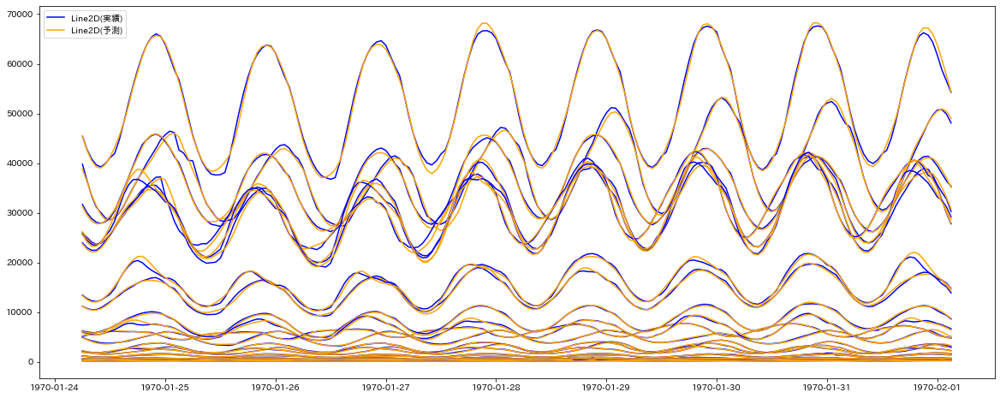

In [ ]:
plt.figure(figsize=(20, 8))
handles = [] 

for i in range(len(result_df["series"].unique())):

    each_series_df = result_df[result_df["series"]==result_df["series"].unique()[i]]

    line1, = plt.plot(
        each_series_df["ds"],
        each_series_df["value"],
        label="実績",
        color="blue"
        )
    
    line2, = plt.plot(
        each_series_df["ds"],
        each_series_df["pred"],
        label="予測",
        color="orange"
    )

    if i % 22 == 0: # 同色をまとめる
        handles.append(line1)
        handles.append(line2)

plt.legend(handles)